In [ ]:
# get the latest version from pypi 
# for other installations approaches, see https://dynamo-release.readthedocs.io/en/latest/ten_minutes_to_dynamo.html#how-to-install
!pip install dynamo-release --upgrade --quiet

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import dynamo as dyn
dyn.__version__

/usr/local/lib/python3.6/dist-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


'0.0.0'

In [2]:
# emulate ggplot2 plotting styple with white background

dyn.configuration.set_figure_params('dynamo', background='white')  

In [3]:
adata = dyn.sample_data.Haber()

/home/xqiu/.local/lib/python3.6/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/preprocess.py:209: RuntimeWarning: invalid value encountered in true_divide
  un_cell_sum / tot_cell_sum,
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/preprocess.py:210: RuntimeWarning: invalid value encountered in true_divide
  sp_cell_sum / tot_cell_sum,
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/preprocess.py:211: RuntimeWarning: invalid value encountered in true_divide
  am_cell_sum / tot_cell_sum,


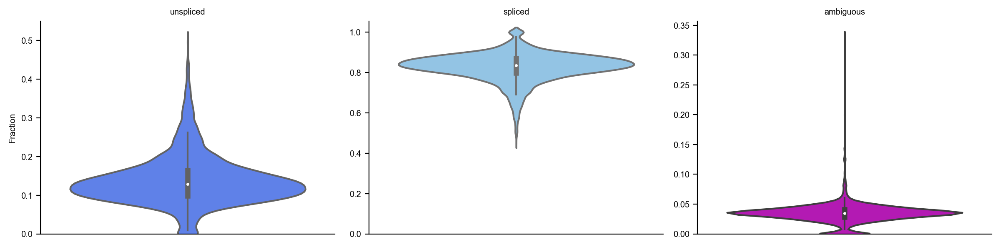

In [4]:
dyn.pl.show_fraction(adata)


In [5]:
dyn.pp.recipe_monocle(adata, n_top_genes=1000)


/home/xqiu/.local/lib/python3.6/site-packages/anndata-0.7.4-py3.6.egg/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/preprocessing/utils.py:439: UserWarning: `total_szfactor` is not `None` and it is not in adata object.
  warnings.warn("`total_szfactor` is not `None` and it is not in adata object.")
/home/xqiu/.local/lib/python3.6/site-packages/anndata-0.7.4-py3.6.egg/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/xqiu/.local/lib/python3.6/site-packages/anndata-0.7.4-py3.6.egg/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype inste

AnnData object with n_obs × n_vars = 7216 × 27998
    obs: 'Bamfile', 'Barcode', 'Celltype', 'Maintype', 'Subsubtype', 'Subtype', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'use_for_pca', 'ntr'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection'
    obsm: 'X_pca', 'X', 'cell_cycle_scores'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'X_spliced', 'X_unspliced'

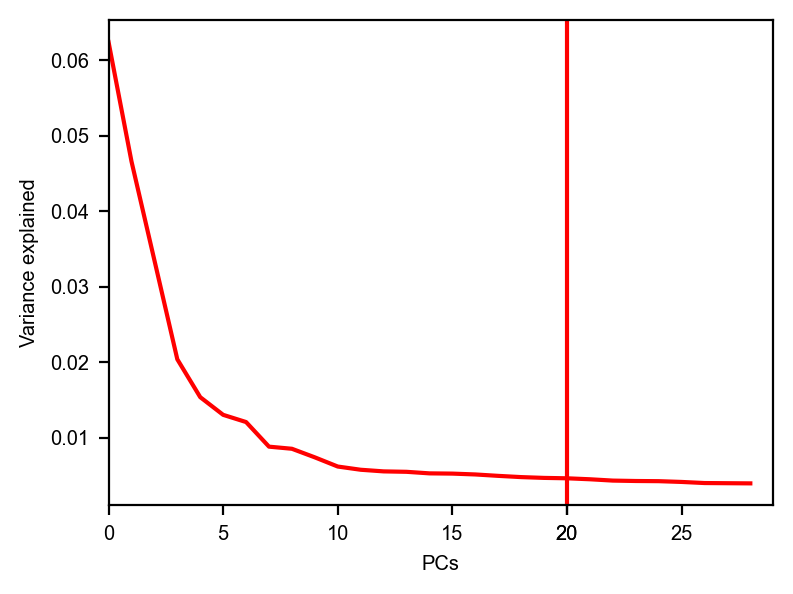

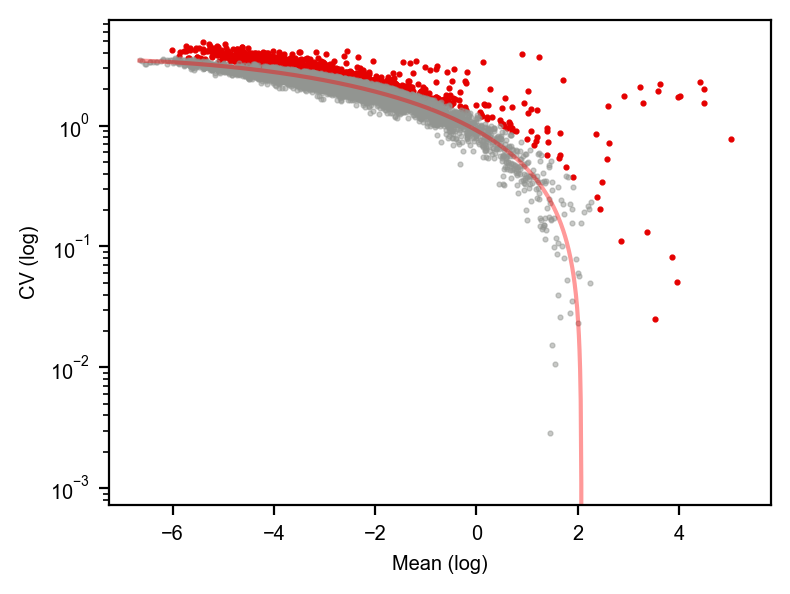

In [6]:
dyn.pl.variance_explained(adata)
dyn.pl.feature_genes(adata)

In [7]:
dyn.tl.dynamics(adata, model='stochastic') 
# or dyn.tl.dynamics(adata, model='deterministic')
# or dyn.tl.dynamics(adata, model='stochastic', est_method='negbin')


/home/xqiu/.local/lib/python3.6/site-packages/anndata-0.7.4-py3.6.egg/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
estimating gamma: 100%|██████████| 1000/1000 [01:11<00:00, 14.03it/s]


AnnData object with n_obs × n_vars = 7216 × 27998
    obs: 'Bamfile', 'Barcode', 'Celltype', 'Maintype', 'Subsubtype', 'Subtype', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics'
    obsm: 'X_pca', 'X', 'cell_cycle_scores'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'X_spliced', 'X_unspliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    ob

In [8]:
dyn.tl.reduceDimension(adata)


AnnData object with n_obs × n_vars = 7216 × 27998
    obs: 'Bamfile', 'Barcode', 'Celltype', 'Maintype', 'Subsubtype', 'Subtype', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit'
    obsm: 'X_pca', 'X', 'cell_cycle_scores', 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'X_spliced', 'X_unspliced', 'M_u', 'M_uu', 'M_s', 

In [9]:
dyn.tl.cell_velocities(adata)


calculating transition matrix via pearson kernel with sqrt transform.: 100%|██████████| 7216/7216 [00:03<00:00, 2051.50it/s]
projecting velocity vector to low dimensional embedding...: 100%|██████████| 7216/7216 [00:02<00:00, 3411.74it/s]


AnnData object with n_obs × n_vars = 7216 × 27998
    obs: 'Bamfile', 'Barcode', 'Celltype', 'Maintype', 'Subsubtype', 'Subtype', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'cell_cycle_scores', 'X_umap', 'velocity_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'u

In [10]:
Haber_genes = ['Bub1', 'Cdk1', 'Nusap1', 'Hist1h2al', "Cdt1", "Orc1"] + \
["Asah2", "Gda", "Slc5a11", '2010106E10Rik',  "Synpo", 'Pdzk1', "Plb1", 'Trpm6',  "Slc5a8", 'Fabp6',   'Rbp2', "Cyp2c66", 'Efr3b', 'Cidec', 'Lmx1a', "Rfx6",  'Dclk1', 'Hck',  'Clca1',  "Spdef", 'Pbk', "Cenpu", "Lgr5", "Slc1a2"]


/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap_.set_bad("lightgray")
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying t

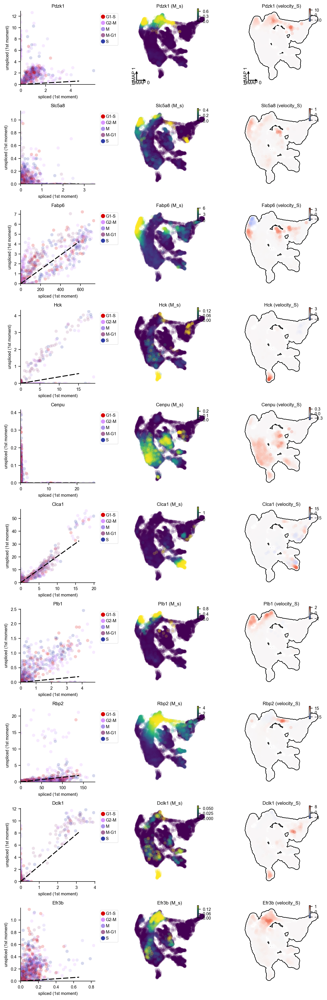

In [11]:
dyn.pl.phase_portraits(adata, genes=Haber_genes, ncols=3, figsize=(3, 3), basis='umap', show_quiver=False)

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


<Figure size 600x400 with 0 Axes>

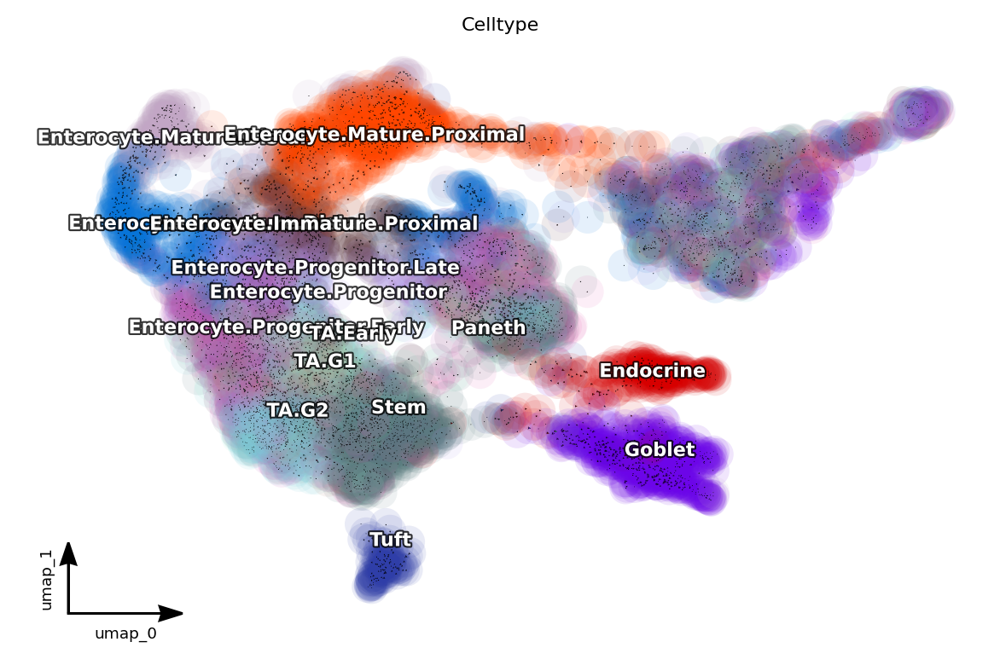

In [12]:
dyn.pl.cell_wise_vectors(adata, color=['Celltype'], basis='umap', quiver_size=2, quiver_length=1) # ['GRIA3', 'LINC00982', 'AFF2']


/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


<Figure size 600x400 with 0 Axes>

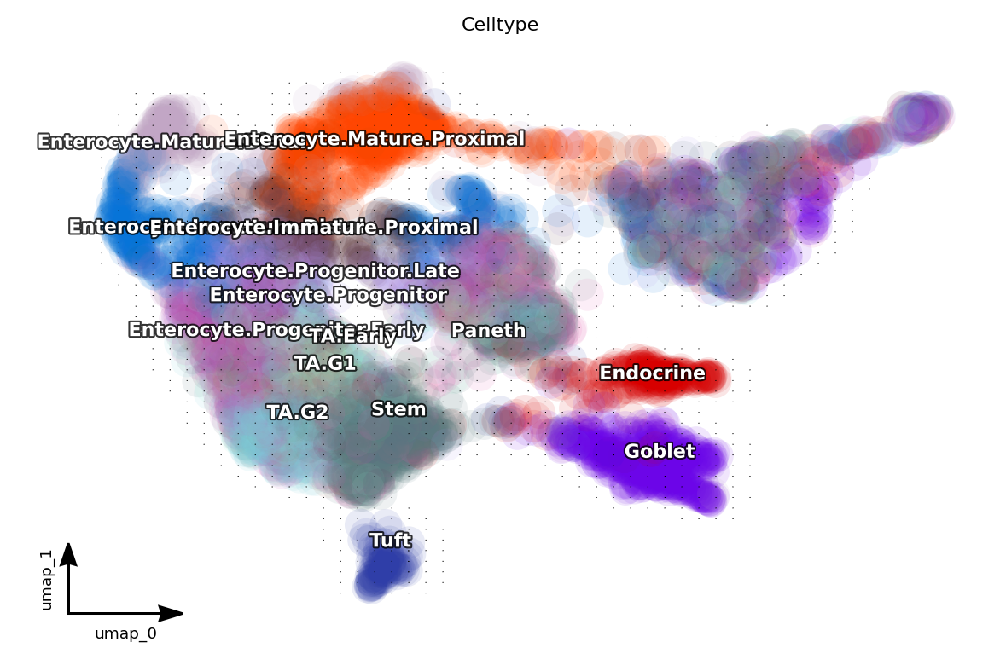

In [13]:
dyn.pl.grid_vectors(adata, color=['Celltype'], basis='umap', method='gaussian')

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


<Figure size 600x400 with 0 Axes>

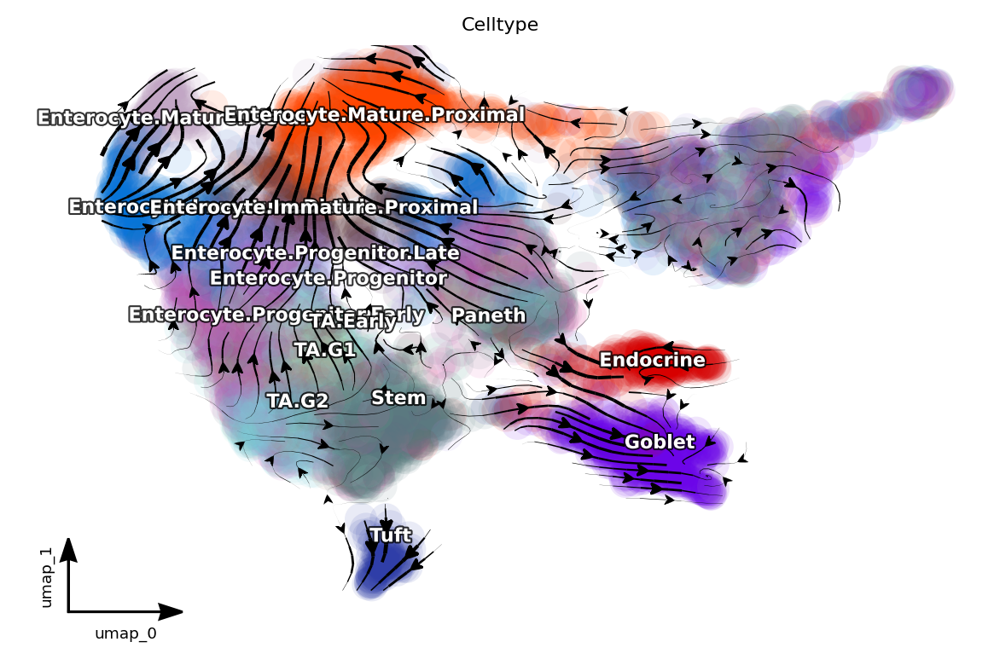

In [14]:

dyn.pl.streamline_plot(adata, color=['Celltype'], basis='umap') 

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap_.set_bad("lightgray")
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/scVectorField.py:1060: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 600x400 with 0 Axes>

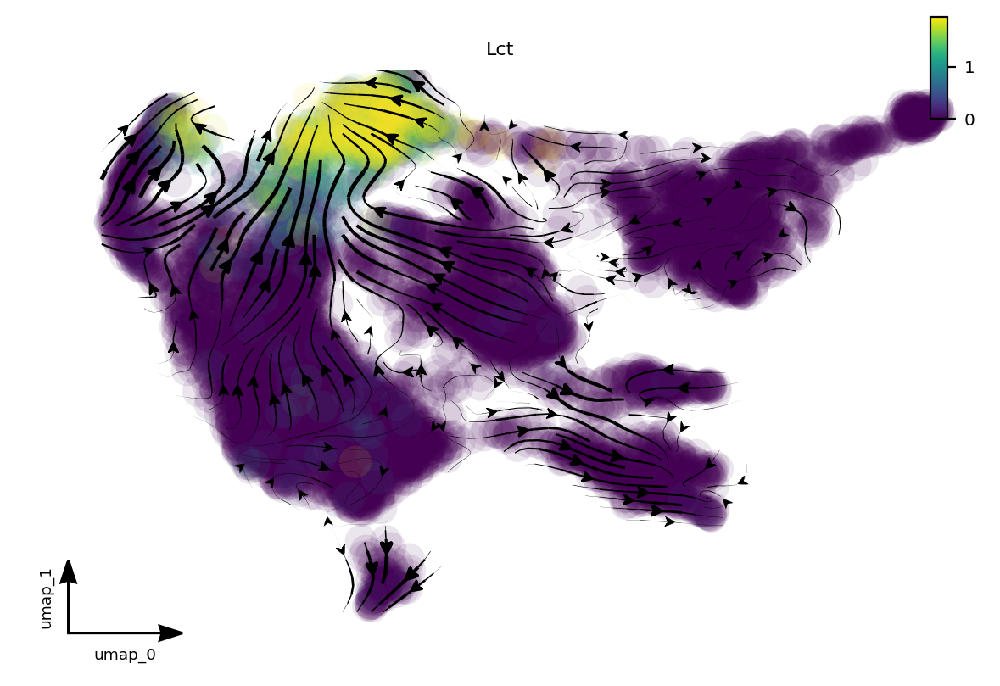

In [16]:
dyn.pl.streamline_plot(adata, color=adata.var.index[adata.var.use_for_transition][:1], basis='umap') 


In [17]:
dyn.vf.VectorField(adata, basis='umap', dims=[0, 1])


/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/vectorfield/topography.py:715: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[control_point][vf_dict['VecFld']['ctrl_idx']] = True
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/vectorfield/topography.py:716: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[inlier_prob][valid_ids] = vf_dict['VecFld']['P'].flatten()


AnnData object with n_obs × n_vars = 7216 × 27998
    obs: 'Bamfile', 'Barcode', 'Celltype', 'Maintype', 'Subsubtype', 'Subtype', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'VecFld_umap', 'VecFld'
    obsm: 'X_pca', 'X', 'cell_c

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


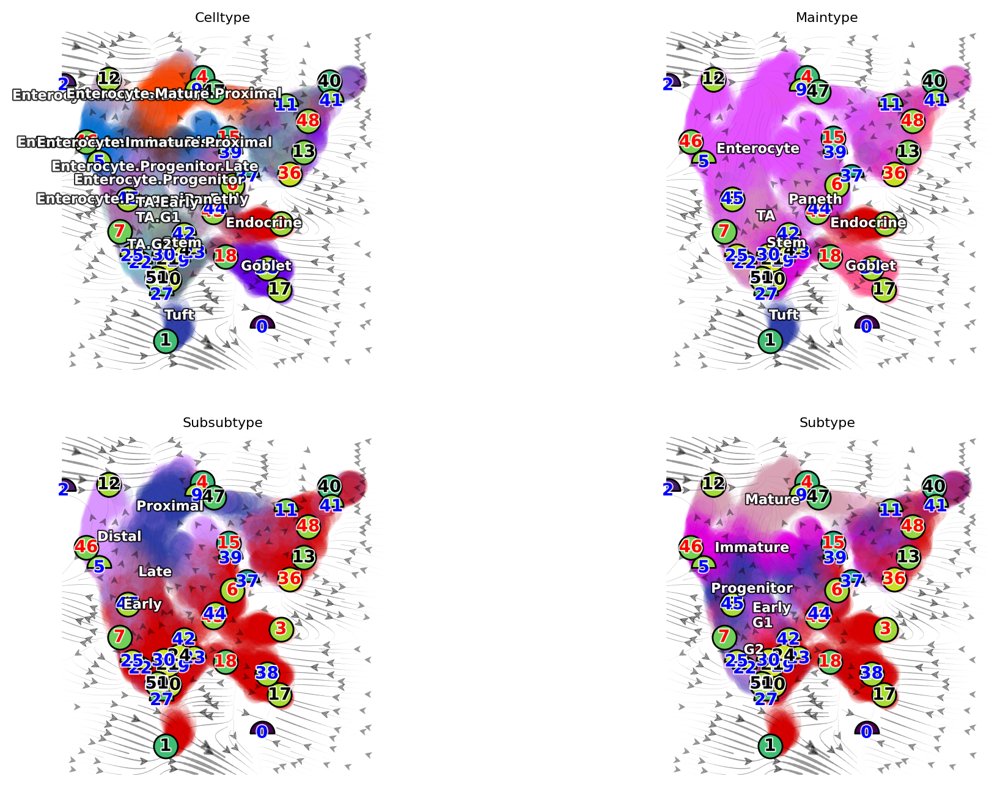

In [18]:
dyn.pl.topography(adata, color=['Celltype', 'Maintype', 'Subsubtype', 'Subtype'], basis='umap', ncols=2)

In [19]:
dyn.configuration.set_figure_params('dynamo', background='black')  

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_dark"))
  cmap.set_bad("lightgray")
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap_.set_bad("lightgray")
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying th

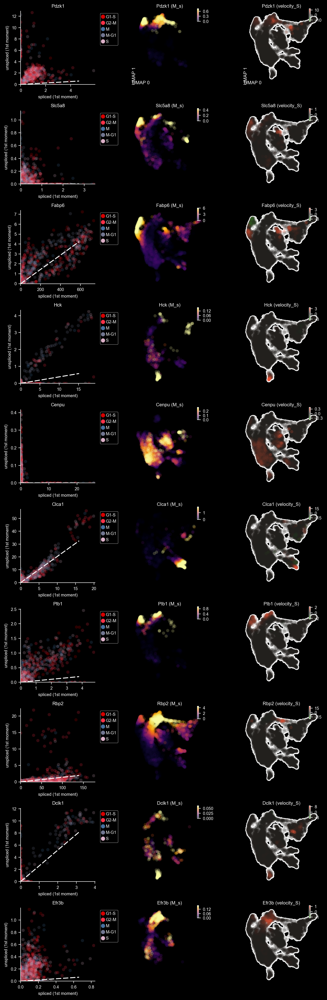

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


<Figure size 600x400 with 0 Axes>

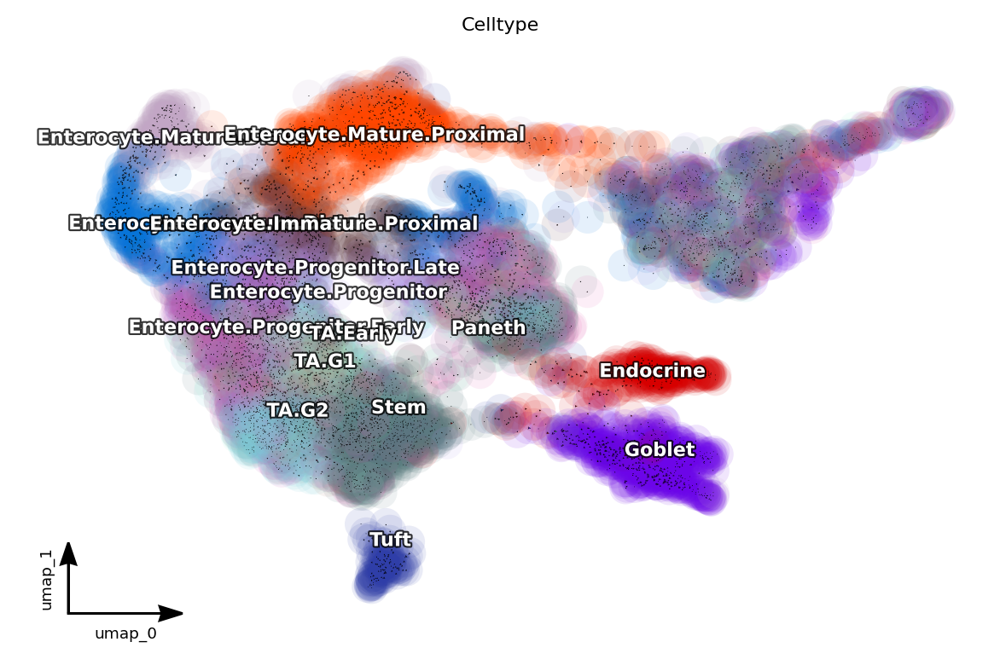

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


<Figure size 600x400 with 0 Axes>

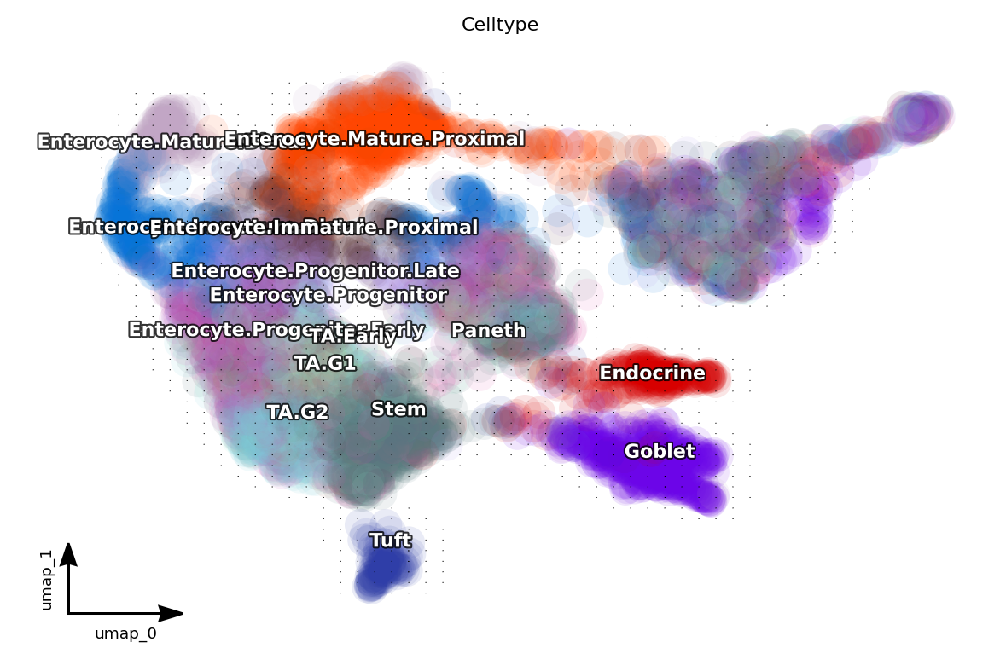

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


<Figure size 600x400 with 0 Axes>

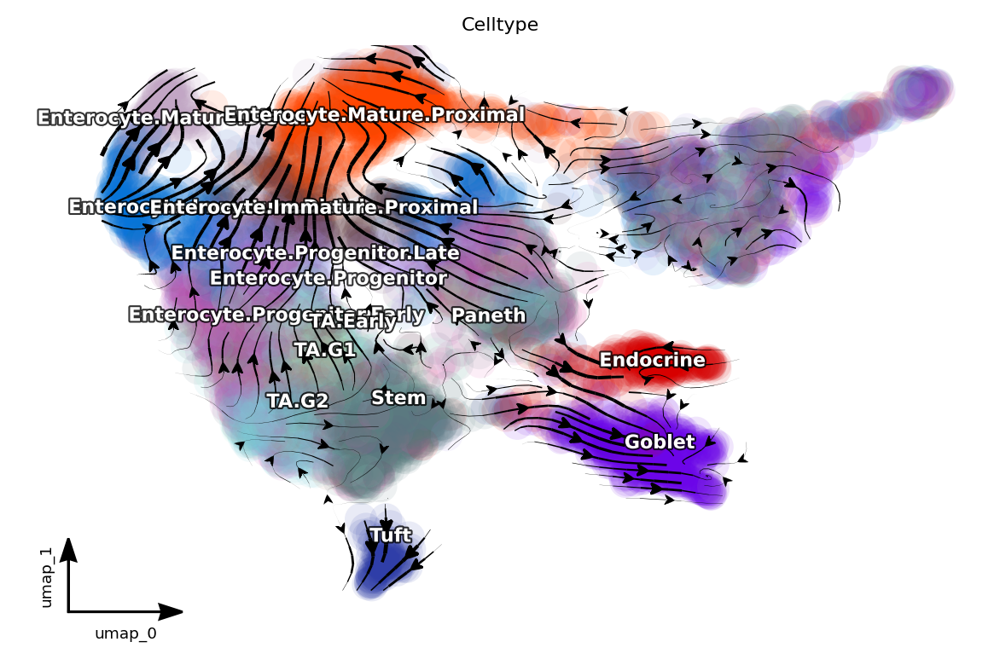

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")


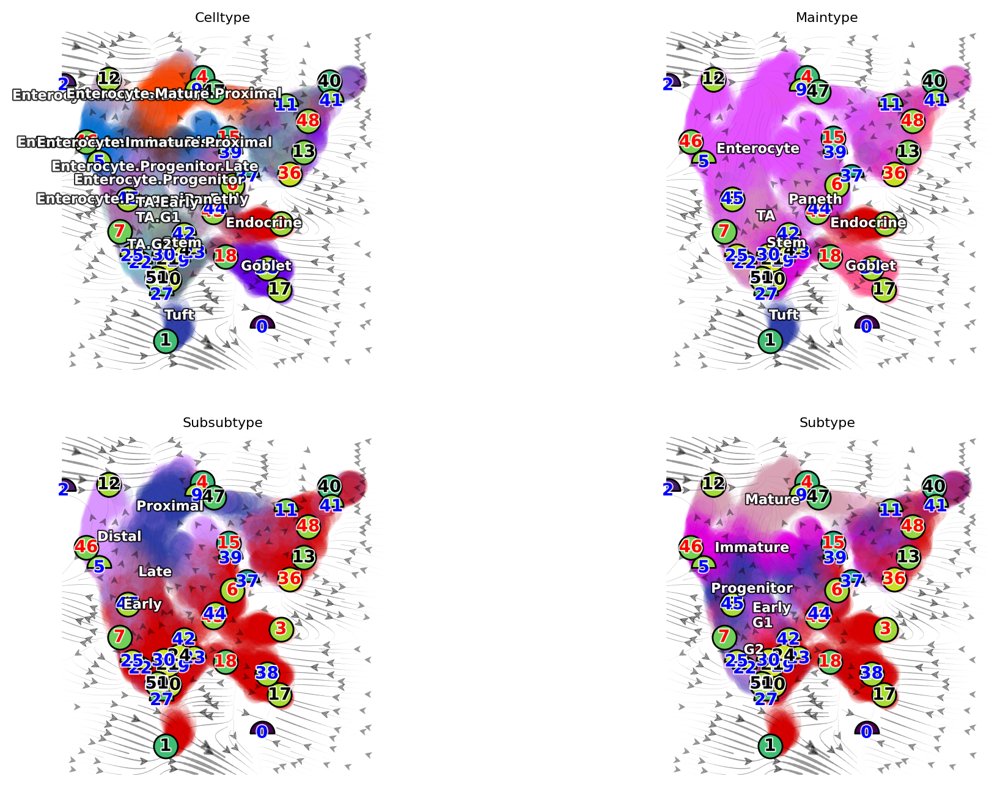

In [20]:
dyn.pl.phase_portraits(adata, genes=Haber_genes, ncols=3, figsize=(3, 3), basis='umap', show_quiver=False)

dyn.pl.cell_wise_vectors(adata, color=['Celltype'], basis='umap', quiver_size=2, quiver_length=1) # ['GRIA3', 'LINC00982', 'AFF2']

dyn.pl.grid_vectors(adata, color=['Celltype'], basis='umap', method='gaussian')

dyn.pl.streamline_plot(adata, color=['Celltype'], basis='umap') 

dyn.pl.topography(adata, color=['Celltype', 'Maintype', 'Subsubtype', 'Subtype'], basis='umap', ncols=2)



In [23]:
dyn.vf.VectorField(adata, basis='umap', dims=[0, 1], M=1000)


/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/vectorfield/topography.py:715: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[control_point][vf_dict['VecFld']['ctrl_idx']] = True
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/vectorfield/topography.py:716: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[inlier_prob][valid_ids] = vf_dict['VecFld']['P'].flatten()


AnnData object with n_obs × n_vars = 7216 × 27998
    obs: 'Bamfile', 'Barcode', 'Celltype', 'Maintype', 'Subsubtype', 'Subtype', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'pca_ddhodge_sampled', 'pca_ddhodge_div', 'pca_potential', 'pca_ddhodge_potential', 'divergence_pca', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'cell_cycle_genes', 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_va

In [31]:
dyn.pl.streamline_plot(adata, color=['Plb1'], basis='umap', show_legend='on data',  background='white', 
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'Haber_streamline', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(3, 3))

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap_.set_bad("lightgray")


Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/Haber_streamline_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

In [30]:
dyn.pl.phase_portraits(adata, genes=['Plb1'], basis='umap',
                       show_quiver=True,
                       background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, alpha = 0.7, quiver_length=10, quiver_size=6, 
                       save_kwargs={'prefix': 'Haber_phase_portrait', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(6, 4))

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:194: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("glasbey_white"))
  cmap.set_bad("lightgray")
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap_.set_bad("lightgray")
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying t

Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/Haber_phase_portrait_dyn_savefig.png...
Done


In [32]:
dyn.pl.topography(adata, color=['Plb1'], basis='umap', show_legend='on data',  background='white',
                        show_arrowed_spines=False, save_show_or_return='save',
                        pointsize=0.4, ncols=1, alpha = 0.7, 
                       save_kwargs={'prefix': 'Haber_topography', 'ext': 'png',
                                     "bbox_inches": None}, 
                        figsize=(3, 3))

/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/plot/utils.py:304: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  cmap_.set_bad("lightgray")


Saving figure to /lab/solexa_weissman/xqiu/proj/Aristotle/dynamo-tutorials/Haber_topography_dyn_savefig.png...
Done


<Figure size 300x300 with 0 Axes>

In [35]:
# dyn.tl.cell_velocities(adata, basis='pca')
dyn.vf.VectorField(adata, basis='pca', M=1000, pot_curl_div=True)


/home/xqiu/.local/lib/python3.6/site-packages/anndata-0.7.4-py3.6.egg/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Constructing diffusion graph from reconstructed vector field: 216it [00:10, 19.07it/s]/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/vectorfield/scVectorField.py:253: RuntimeWarning: invalid value encountered in true_divide
  u = (y - x) / np.linalg.norm(y - x)
Constructing diffusion graph from reconstructed vector field: 5000it [03:56, 21.12it/s]
Calculating divergence: 100%|██████████| 7216/7216 [00:03<00:00, 2027.80it/s]
/home/xqiu/.local/lib/python3.6/site-packages/dynamo_release-0.95.2-py3.6.egg/dynamo/vectorfield/topography.py:715: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/panda

LinAlgError: Array must not contain infs or NaNs.

In [ ]:
adata

In [ ]:
dyn.tl.cell_velocities(adata, basis='pca')
dyn.vf.VectorField(adata, basis='pca')
dyn.vf.speed(adata, basis='pca')
dyn.vf.divergence(adata, basis='pca')
dyn.vf.acceleration(adata, basis='pca')
dyn.vf.curl(adata, basis='umap')

In [ ]:
adata

In [ ]:
import matplotlib.pyplot as plt
fig1, f1_axes = plt.subplots(ncols=5, nrows=1, constrained_layout=True, figsize=(15, 3))
f1_axes
f1_axes[0] = dyn.pl.streamline_plot(adata, basis='umap', color='pca_ddhodge_potential', pointsize=0.1, alpha = 0.7, ax=f1_axes[0], quiver_length=6, 
                                    quiver_size=6, save_show_or_return='return', show_arrowed_spines=False)
f1_axes[1] = dyn.pl.streamline_plot(adata, basis='umap', color='speed_pca', ax=f1_axes[1], quiver_length=12, quiver_size=12, save_show_or_return='return', 
                                    show_arrowed_spines=False)
f1_axes[2] = dyn.pl.streamline_plot(adata, basis='umap', color='divergence_pca', ax=f1_axes[2], save_show_or_return='return',
                                   show_arrowed_spines=False)
f1_axes[3] = dyn.pl.streamline_plot(adata, basis='umap', color='acceleration_pca', ax=f1_axes[3], save_show_or_return='return', 
                                    show_arrowed_spines=False)
f1_axes[4] = dyn.pl.streamline_plot(adata, basis='umap', color='curl_umap', ax=f1_axes[4], save_show_or_return='return', 
                                    show_arrowed_spines=False)
plt.savefig(dpi=300, fname='./Haber_vector_calculus.png')

In [ ]:
example_genes = ['Plb1']
import numpy as np 

dyn.pl.scatters(adata, x=np.repeat('pca_ddhodge_potential', 1),
                     y=example_genes, layer='X_spliced', color='pca_ddhodge_potential', 
                     background='white', figsize=(3, 3), save_show_or_return='save',
                     pointsize=0.4, ncols=1, alpha = 0.7, 
                     save_kwargs={'prefix': 'Haber_potential', 'ext': 'png', "bbox_inches": None})